# **Lab Assignment 2 - GG3209 - Notebook 2**
# **Part 3: GeoPandas and Rasterio**
### Student No. 230012841
### GitHub Repo:  https://github.com/LGroves18/GG3209_Lab_Assignment_2

------------

## **Introduction**
This notebook contains the solutions for Assignment 2.

To ensure my work remains structured and manageable, I have decided to split my work into 3 seperate notebooks.

**Notebook 1** covers **Part 1: Python Basics** and **Part 2: Numpy/Pandas. **

**Notebook 2 (this notebook)** covers **Part 3: GeoPandas/Rasterio**

**Notebook 3** covers **Part 4: Spatial Clustering.**

--------------

# **Part 3: GeoPandas and Rasterio**
This section covers topics such as the fundamentals of GeoPandas, Rasterio, and plotting graphs.

I have included the questions and answers for each task.

In [ ]:
# First I must load the required data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Practicing GeoPandas

Once you have mount the Drive and locate the path of the folder **london_data** you will find a shapefile representing the LSOA polygons with the population from the latest census 2021. E.g **data\london_data\Census20_LSOA.shp** For example, the column "Pop20" contains population counts for each LSOA area. For this excersice you need to create and write the code for the following challenges.

Create Text and Code cells to describe clearly the following challenges.

- Read the **Census20_LSOA.shp** layer into a GeoDataFrame.
- Subset the following columns (plus the geometry!):
    
    * LSOA11CD --> LSOA area code
    * LSOA11NM --> LSOA area name
    * LSOA11NMW --> LSOA bigger area
    * Pop20 -->  Population counts

- What is the Coordinate Reference System of the layer?

- How many features does the layer contain? Write an expression that returns the result as int.

- The values in the "LSOA11CD" column (code area ID) should all be unique. How can you make sure? Either use one of the methods we learned earlier, or search online (e.g., google “pandas check for duplicates”).

- Plot the layer using the **.plot** method

- Plot the layer using the **.explorer** method

- Subset just the LSOA areas with Pop20 counts greater than 1500.

- Plot the resulting subset, using symbology according to total population size, i.e., the "Pop_Total" column, and using a sequentual color map such as "Reds".

- How many areas are there with the requested population? (hint: shape)

- What is the total population of the subset layer? (hint: sum)

In [ ]:
# Before I can read anything, I have to import the necessary packages/libraries.

In [ ]:
pip install contextily

In [ ]:
pip install mapclassify

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import geopandas as gpd
import contextily as ctx
import rasterio as rio
from rasterio import plot

In [ ]:
# Perfect! Now that everything has been imported, we can begin.
# Step 1: Read the shapefile into a geodataframe:
census_data = gpd.read_file('/content/drive/MyDrive/GG3209_Spatial_Analysis_With_GIS/london_data/Census20_LSOA.shp')
census_data.head(10)

,LSOA11CD,LSOA11NM,LSOA11NMW,BNG_E,BNG_N,LONG,LAT,Shape__Are,Shape__Len,GlobalID,MERGE_SRC,Shape_Leng,Shape_Area,LSOA_Code,LSOA_Name,Pop20,ObjectID,geometry
0,E01000001,City of London 001A,City of London 001A,532129,181625,-0.097060,51.51810,133324.978691,2291.187925,e87faa35-c559-4230-93be-8484ab490f70,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2291.187925,133324.978700,E01000001,City of London 001A,1749.0,28010,"POLYGON ((532105.092 182011.23, 532162.491 181..."
1,E01000002,City of London 001B,City of London 001B,532480,181699,-0.091970,51.51868,226210.015953,2488.086900,f0e3338a-e889-49be-8ca4-c7f2de90afd6,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2488.086900,226210.015930,E01000002,City of London 001B,1678.0,28011,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,City of London 001C,532245,182036,-0.095230,51.52176,57285.328705,1142.242230,a3512b47-41ae-4703-8264-c7cc44db1b37,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,1142.242230,57285.328700,E01000003,City of London 001C,1900.0,28012,"POLYGON ((532135.138 182198.131, 532158.25 182..."
3,E01000005,City of London 001E,City of London 001E,533581,181265,-0.076280,51.51452,190747.438499,2167.872156,b62f5c70-737d-4936-9c85-eef139fce72f,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2167.872156,190747.438514,E01000005,City of London 001E,2181.0,28013,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01000006,Barking and Dagenham 016A,Barking and Dagenham 016A,544994,184276,0.089318,51.53876,144195.364548,1935.412725,f74c0183-63f6-4468-b58d-577339257dea,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,1935.412725,144195.364528,E01000006,Barking and Dagenham 016A,2117.0,28016,"POLYGON ((545122.049 184314.931, 545271.849 18..."
5,E01000007,Barking and Dagenham 015A,Barking and Dagenham 015A,544189,184454,0.077792,51.54057,198162.898933,2824.079223,431b4d37-f232-4403-9803-0058f068b232,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2824.079223,198162.898922,E01000007,Barking and Dagenham 015A,2704.0,28017,"POLYGON ((544180.347 184700.582, 544317.196 18..."
6,E01000008,Barking and Dagenham 015B,Barking and Dagenham 015B,543576,184276,0.068886,51.53913,193415.705849,3908.224469,21cd4ce1-d0c7-41fb-b88d-901bb2922c99,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,3908.224469,193415.705821,E01000008,Barking and Dagenham 015B,1594.0,28018,"MULTIPOLYGON (((543754.262 184071.746, 543684...."
7,E01000009,Barking and Dagenham 016B,Barking and Dagenham 016B,544588,184434,0.083533,51.54029,128580.601669,2065.903264,9ae040b4-c79c-45b5-9339-30eb42d4a68a,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,2065.903264,128580.601658,E01000009,Barking and Dagenham 016B,1959.0,28019,"POLYGON ((544499.837 184704.366, 544630.292 18..."
8,E01000010,Barking and Dagenham 015C,Barking and Dagenham 015C,544299,184019,0.079199,51.53663,348603.302513,3097.462623,dd856fc9-15f2-495d-8ce4-03424a39d98e,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,3097.462623,348603.302512,E01000010,Barking and Dagenham 015C,3650.0,28020,"POLYGON ((544174 184361, 544211 184317, 544256..."
9,E01000011,Barking and Dagenham 016C,Barking and Dagenham 016C,544407,184736,0.081049,51.54305,90289.081680,1495.965965,79f3df75-550f-45c6-b13b-57cb979a03c7,LSOA__Dec_2011__Boundaries_Generalised_Clipped...,1495.965965,90289.081703,E01000011,Barking and Dagenham 016C,1753.0,28021,"POLYGON ((544523.402 184789.039, 544667.055 18..."


In [ ]:
# Step 2: Subset the following columns (plus the geometry)

In [ ]:
# Here I am subsetting the attributes to make a smaller table with the more relevant info:
small_census = census_data[["LSOA11CD", "LSOA11NM", "LSOA11NMW", "Pop20", "geometry"]]
small_census.head(8)

,LSOA11CD,LSOA11NM,LSOA11NMW,Pop20,geometry
0,E01000001,City of London 001A,City of London 001A,1749.0,"POLYGON ((532105.092 182011.23, 532162.491 181..."
1,E01000002,City of London 001B,City of London 001B,1678.0,"POLYGON ((532634.497 181926.016, 532619.141 18..."
2,E01000003,City of London 001C,City of London 001C,1900.0,"POLYGON ((532135.138 182198.131, 532158.25 182..."
3,E01000005,City of London 001E,City of London 001E,2181.0,"POLYGON ((533808.018 180767.774, 533649.037 18..."
4,E01000006,Barking and Dagenham 016A,Barking and Dagenham 016A,2117.0,"POLYGON ((545122.049 184314.931, 545271.849 18..."
5,E01000007,Barking and Dagenham 015A,Barking and Dagenham 015A,2704.0,"POLYGON ((544180.347 184700.582, 544317.196 18..."
6,E01000008,Barking and Dagenham 015B,Barking and Dagenham 015B,1594.0,"MULTIPOLYGON (((543754.262 184071.746, 543684...."
7,E01000009,Barking and Dagenham 016B,Barking and Dagenham 016B,1959.0,"POLYGON ((544499.837 184704.366, 544630.292 18..."


In [ ]:
# Next up: the CRS.
small_census.crs
# The CRS is EPSG: 27700 - British National Grid.

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.01, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [ ]:
# Now for the number of features.
feature_count = len(small_census)
print(feature_count)
print(type(feature_count))

3920
<class 'int'>


In [ ]:
# Here I am going to check for any duplicates. I googled it and found two different methods.

# Method 1:
is_unique = small_census['LSOA11CD'].is_unique
print(f"Are all LSOA11CD values unique? {is_unique}")

# Method 2:
duplicate_count = small_census['LSOA11CD'].duplicated().sum()
print(f"Number of duplicate LSOA11CD values: {duplicate_count}")

Are all LSOA11CD values unique? True
Number of duplicate LSOA11CD values: 0


<Axes: >

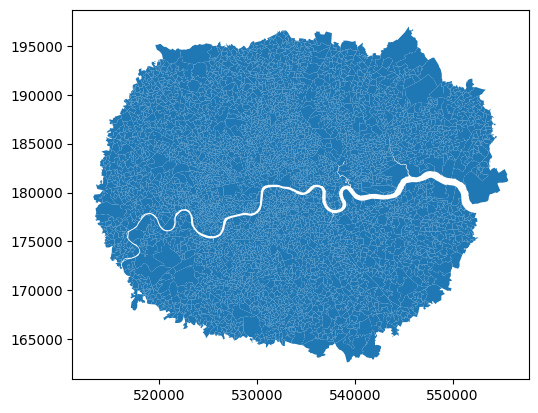

In [ ]:
# Now I will plot the layer using the .plot method.
small_census.plot()

In [ ]:
# Here I am plotting the layer using the explorer method
small_census.explore()

In [ ]:
# Subset just the LSOA areas with Pop20 counts greater than 1500:
Large_Pop = small_census[small_census['Pop20'] > 1500]

In [ ]:
# Plot the resulting subset, using symbology according to total population size, i.e., the "Pop_Total" column, and using a sequentual color map such as "Reds".
Large_Pop.explore(column = 'Pop20', cmap = 'Reds')
# Here we can see that Newham 013G has the highest population count by far.

In [ ]:
# Let's find out how many areas there are with the requested population:
Large_Pop.shape
# Answer: 3361!

(3361, 5)

In [ ]:
# Let's calculate the total population of the subset layer using sum:
total_population = Large_Pop['Pop20'].sum()
print(total_population)

6587889.0


------------

# Practicing Rasterio

#### Instructions:
Download the following raster image, and then write the required code to accomplish the following challenges.

You need to download the Zip file containing the raster (TIFF file) and then Unzipped and upload it to your Google Drive or Jupyter Notebook session, the later remove the file once the session is close.

https://uostandrews.maps.arcgis.com/home/item.html?id=d91890cc59d74b97986591f532410cf8

Create Text and Code cells to clearly describe the following challenges:

- Read the file as a rasterio dataset
- What is the CRS of the dataset?
- What is the raster extent (bounds) of the dataset in projected coordinates?
- How many bands are there in this dataset?
- Create a plot of the image
- Create a Histograms from the raster
- Using EarthPy create a plot of false color (if you have an issue whith this, please describe the potential cause)


In [ ]:
# First, we must import rasterio as rio
import rasterio as rio

In [ ]:
# Let's read the file as a rasterio dataset.
elev = rio.open('/content/drive/MyDrive/GG3209_Spatial_Analysis_With_GIS/Clipped_Raster.tif')

In [ ]:
# Let's see what the CRS of this file is:
print(elev.crs)

EPSG:32610


In [ ]:
# Now let's see what the raster extent (bounds) of the dataset in projected coordinates are:
print(elev.bounds)

BoundingBox(left=532627.5, bottom=5221222.5, right=639232.5, top=5289412.5)


In [ ]:
# How many bands are there in this dataset?
print("Number of Bands:", elev.count)

Number of Bands: 1


In [ ]:
# Reading Raster Data into a Array
# I used `elev.read(1)` to extract the pixel elevation values from Band 1 into a 2D NumPy array (`elev_arr`) for numerical analysis and plotting.
elev_arr = elev.read(1)
elev_arr

array([[ 6262,  6174,  6215, ..., 25670, 26346, 24938],
       [ 6391,  6336,  6279, ..., 27755, 27389, 24628],
       [ 6345,  6386,  6370, ..., 30870, 30865, 26554],
       ...,
       [ 5904,  5920,  5963, ..., 14370,  8356,  6719],
       [ 5974,  5982,  5979, ...,  7379,  6677,  6597],
       [ 5971,  5964,  5912, ...,  6410,  6519,  6518]], dtype=uint16)

In [ ]:
# This line of code creates a masked array using numpy (I had to Google this). It finds all pixels in my elevation array where the elevation value equals 0 and marks them as masked so Python ignores them in future plots and statistical calculations.
image_read_masked = np.ma.masked_array(elev_arr, mask=(elev_arr == 0))

In [ ]:
pip install earthpy #Only run this cell once.

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 21.0 MB/s eta 0:00:00


In [ ]:
# Let's import earthpy - it allows me to plot rasters.
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

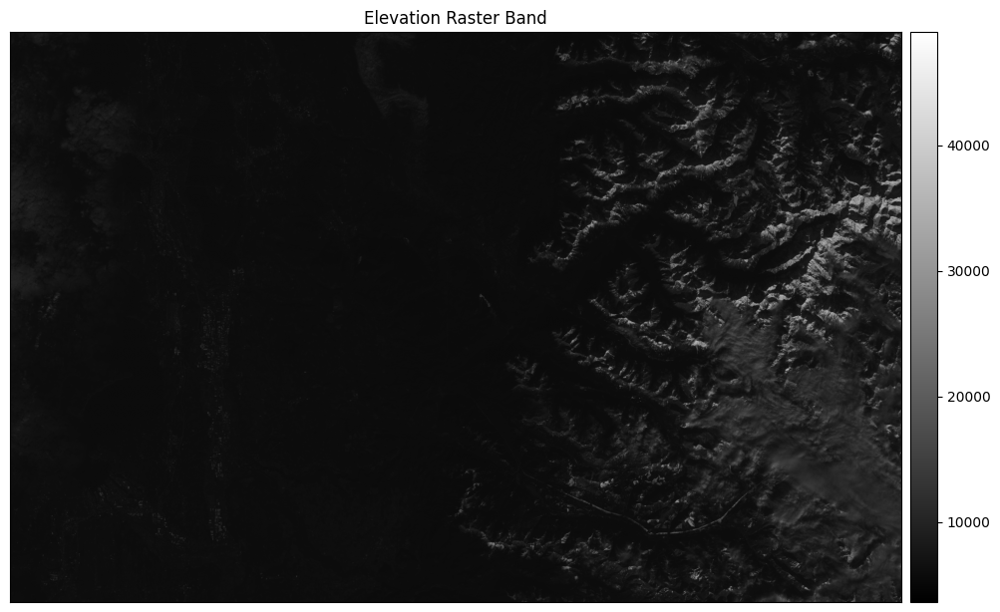

In [ ]:
# Let's create a plot of the raster image using earthpy.

plt.rcParams['figure.figsize'] = [10, 8]

# Plot single band (elev_arr) using EarthPy
ep.plot_bands(
    elev_arr,
    cmap="gist_gray",
    title="Elevation Raster Band"
)

plt.show()

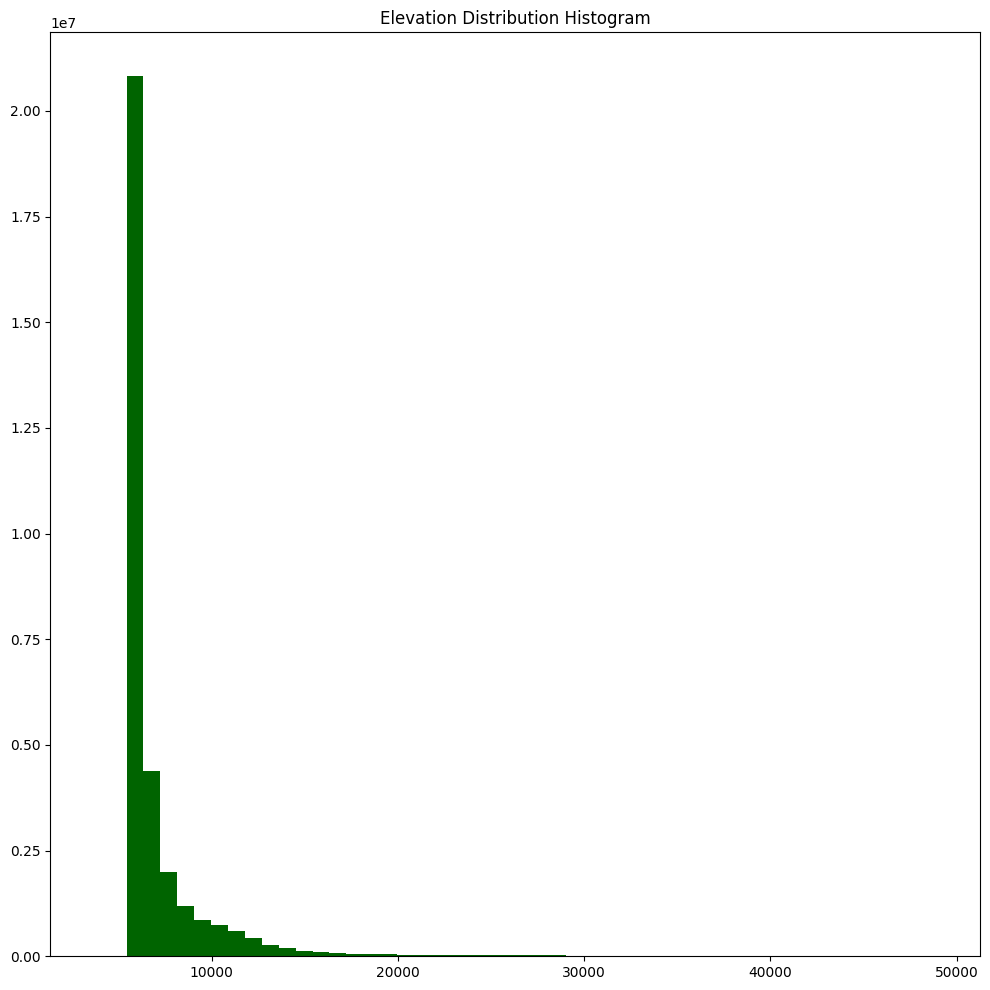

In [ ]:
# Here I will create a histogram:

plt.rcParams['figure.figsize'] = [10, 8] # Set the size
ep.hist(
    elev_arr,
    bins=50,
    colors = ['darkgreen'],
    title=['Elevation Distribution Histogram']
)
plt.show()

# Basically, the X axis represents the elevation value.
# As we can see, there is a lot more dark than light - most of the raster image is low elevation.
# The Y axis represents pixel count. The 1e7 in the top left corner means it's 10^7 (10,000,000).
# Which means that the largest bar is showing over 20 million pixels at low elevation.

### I can't generate a plot with different bands because this dataset only has one band. It's not a satellite image with RGB bands. It's a DEM.